In [1]:
#Load Dataset
dir_path = '../Skripsi/archive/casting_data/casting_data/'
# train data
dir_train = dir_path + 'train/'
dir_train_def = dir_train + 'def_front/'
dir_train_ok = dir_train + 'ok_front/'

# test data
dir_test = dir_path + 'test/'
dir_test_def = dir_test + 'def_front/'
dir_test_ok = dir_test + 'ok_front/'

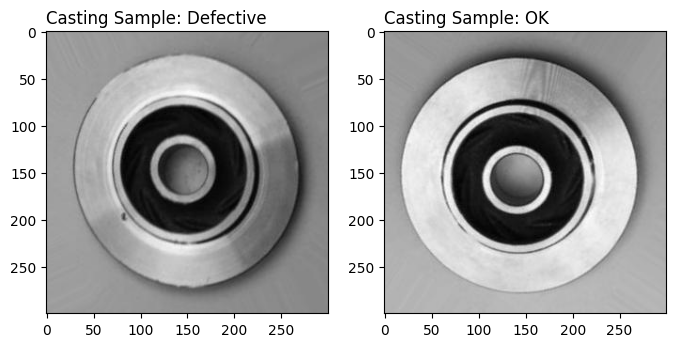

In [2]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt# Plot samples data
fig, axes = plt.subplots(1, 2, figsize=(8,4))
sample_def = plt.imread(dir_train_def+os.listdir(dir_train_def)[0])
sample_ok = plt.imread(dir_train_ok+os.listdir(dir_train_ok)[0])
axes[0].imshow(sample_def)
axes[1].imshow(sample_ok)
axes[0].set_title('Casting Sample: Defective', loc='left')
axes[1].set_title('Casting Sample: OK', loc='left')
axes[0].grid(False)
axes[1].grid(False)
plt.show()

In [3]:
print("The Train Data has the following distribution of Ok and Defective")
print("Total:",len(os.listdir(dir_train + 'ok_front')) + len(os.listdir(dir_train + 'def_front')))
print("OK:",len(os.listdir(dir_train + 'ok_front')))
print("Def:",len(os.listdir(dir_train + 'def_front')))

print("\nThe Test Data has the following distribution of Ok and Defective")
print("Total:",len(os.listdir(dir_test + 'ok_front')) + len(os.listdir(dir_test + 'def_front')))
print("OK:",len(os.listdir(dir_test + 'ok_front')))
print("Def:",len(os.listdir(dir_test + 'def_front')))

The Train Data has the following distribution of Ok and Defective
Total: 6633
OK: 2875
Def: 3758

The Test Data has the following distribution of Ok and Defective
Total: 715
OK: 262
Def: 453


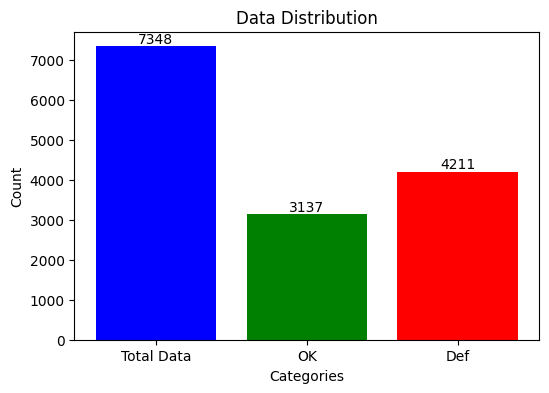

In [18]:
import matplotlib.pyplot as plt

# Train Data
train_ok = len(os.listdir(dir_train + 'ok_front'))
train_def = len(os.listdir(dir_train + 'def_front'))

# Test Data
test_ok = len(os.listdir(dir_test + 'ok_front'))
test_def = len(os.listdir(dir_test + 'def_front'))

# Total Data
total_ok = train_ok + test_ok
total_def = train_def + test_def
total_data = total_ok + total_def

# Data untuk chart
categories = ['Total Data', 'OK', 'Def']
data = [total_data, total_ok, total_def]

# Plot chart
plt.figure(figsize=(6, 4))
plt.bar(categories, data, color=['blue', 'green', 'red'])
plt.title('Data Distribution')
plt.xlabel('Categories')
plt.ylabel('Count')

# Tampilkan angka di dalam chart
for i, count in enumerate(data):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()


In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
test_gen = ImageDataGenerator(rescale=1./255)

img_size, batch_size, rand_seed = (300, 300), 32, 0
test_size, batch_size, rand_seed = (300, 300), 715, 0
arg_train = {'target_size': img_size,
             'color_mode': 'grayscale',
             'classes': {'ok_front': 0,
                         'def_front': 1},
             'class_mode': 'binary',
             'batch_size': batch_size,
             'seed': rand_seed}
arg_test = {'target_size': test_size,
            'color_mode': 'grayscale',
            'classes': {'ok_front': 0,
                        'def_front': 1},
            'class_mode': 'binary',
            'batch_size': batch_size,
            'seed': rand_seed,
            'shuffle': False}


train_set = train_gen.flow_from_directory(
    directory=dir_train, subset='training', **arg_train)
valid_set = train_gen.flow_from_directory(
    directory=dir_train, subset='validation', **arg_train)
test_set = test_gen.flow_from_directory(
    directory=dir_test, **arg_test)

Found 5307 images belonging to 2 classes.
Found 1326 images belonging to 2 classes.
Found 715 images belonging to 2 classes.


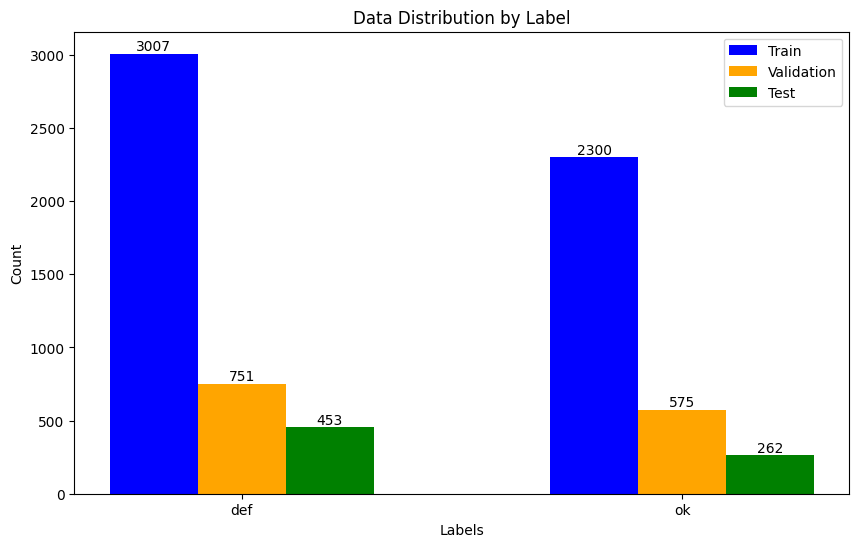

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Label kategori
labels = ['def', 'ok']

# Jumlah data untuk setiap label pada train, validasi, dan test
train_counts = [train_label_counts[1], train_label_counts[0]]
valid_counts = [valid_label_counts[1], valid_label_counts[0]]
test_counts = [test_label_counts[1], test_label_counts[0]]

# Plot chart
plt.figure(figsize=(10, 6))

plt.bar(np.arange(len(labels))-0.2, train_counts, width=0.2, align='center', label='Train', color='blue')
plt.bar(np.arange(len(labels)), valid_counts, width=0.2, align='center', label='Validation', color='orange')
plt.bar(np.arange(len(labels))+0.2, test_counts, width=0.2, align='center', label='Test', color='green')

plt.title('Data Distribution by Label')
plt.xlabel('Labels')
plt.ylabel('Count')

plt.xticks(np.arange(len(labels)), labels)
plt.legend()

# Tampilkan angka di dalam chart
for i, count in enumerate(train_counts):
    plt.text(i-0.2, count, str(count), ha='center', va='bottom')
for i, count in enumerate(valid_counts):
    plt.text(i, count, str(count), ha='center', va='bottom')
for i, count in enumerate(test_counts):
    plt.text(i+0.2, count, str(count), ha='center', va='bottom')

plt.show()


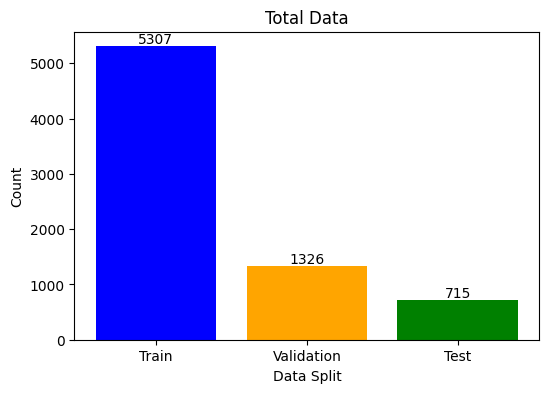

In [23]:
import matplotlib.pyplot as plt
import numpy as np

# Label kategori
labels = ['Train', 'Validation', 'Test']

# Jumlah data untuk setiap label pada train, validasi, dan test
train_total = sum(train_label_counts)
valid_total = sum(valid_label_counts)
test_total = sum(test_label_counts)

# Plot chart
plt.figure(figsize=(6, 4))

plt.bar(np.arange(len(labels)), [train_total, valid_total, test_total], color=['blue', 'orange', 'green'])
plt.title('Total Data')
plt.xlabel('Data Split')
plt.ylabel('Count')

plt.xticks(np.arange(len(labels)), labels)

# Tampilkan angka di dalam chart
for i, count in enumerate([train_total, valid_total, test_total]):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 16)      160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 75, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 37, 37, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 18, 18, 64)       0

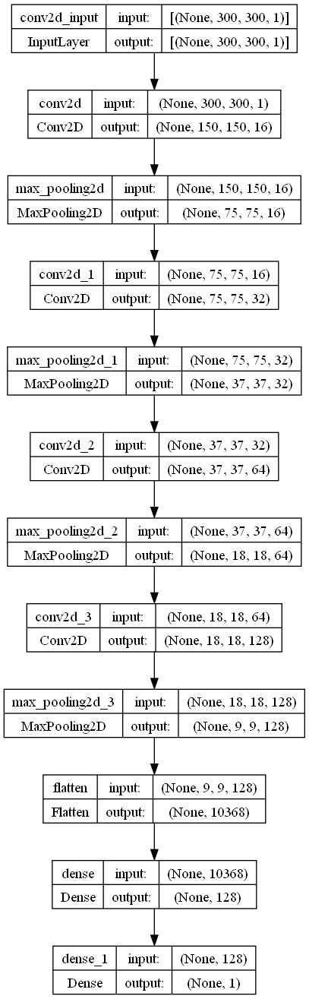

In [24]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.utils import plot_model

model_architecture = Sequential([
    Conv2D(filters=16, kernel_size=(3, 3), strides=2, activation="relu", padding="same", input_shape=(300, 300, 1)),
    MaxPooling2D(pool_size=(2, 2), strides=2),
    Conv2D(filters=32, kernel_size=(3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2), strides=2),
    Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2), strides=2),
    Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2), strides=2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation="sigmoid")
])
optimizers = [
    Adam(),
    RMSprop(),
    SGD()
]




for optimizer in optimizers:
    model_architecture.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])
model_architecture.summary()
plot_model(model_architecture, to_file='model_architecture.png', show_shapes=True)


In [27]:
import visualkeras
visualkeras.layered_view(model_architecture)

ModuleNotFoundError: No module named 'visualkeras'

In [18]:
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from tensorflow.keras.optimizers import Adam, SGD, RMSprop

import time


num_epochs = [25, 50]
log_dir = "logs"
model_weights_file = "model_weights.h5"



for optimizer in optimizers:
    optimizer_name = optimizer.__class__.__name__
    for num_epoch in num_epochs:
        log_subdir = f"{optimizer_name}_epochs_{num_epoch}_{int(time.time())}"
        tensorboard_callback = TensorBoard(log_dir=os.path.join(log_dir, log_subdir))

        model_architecture = Sequential([
            Conv2D(filters=16, kernel_size=(3, 3), strides=2, activation="relu", padding="same", input_shape=(300, 300, 1)),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=32, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Flatten(),
            Dense(units=1, activation="sigmoid")
])
        model_architecture.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])
        checkpoint_callback = ModelCheckpoint(model_weights_file, monitor='val_accuracy', save_best_only=True, mode='max')


        model_architecture.fit(train_set, validation_data=valid_set, epochs=num_epoch, callbacks=[tensorboard_callback])
        model_architecture.save_weights(f"{optimizer_name}_epochs_{num_epoch}_{model_weights_file}")
        print(f"Optimizer: {optimizer_name}, Epochs: {num_epoch}")
        print("Training and saving weights completed successfully.")
        model_architecture = Sequential([
            Conv2D(filters=16, kernel_size=(3, 3), strides=2, activation="relu", padding="same", input_shape=(300, 300, 1)),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=32, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding="same"),
            MaxPooling2D(pool_size=(2, 2), strides=2),
            Flatten(),
            Dense(units=1, activation="sigmoid")
])
    model_architecture.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])



Epoch 1/25
8/8 [==============================] - 80s 10s/step - loss: 0.6856 - accuracy: 0.5483 - val_loss: 0.6809 - val_accuracy: 0.5664
Epoch 2/25
8/8 [==============================] - 75s 9s/step - loss: 0.6754 - accuracy: 0.5836 - val_loss: 0.6677 - val_accuracy: 0.7421
Epoch 3/25
8/8 [==============================] - 69s 8s/step - loss: 0.6430 - accuracy: 0.6544 - val_loss: 0.5863 - val_accuracy: 0.7330
Epoch 4/25
8/8 [==============================] - 64s 8s/step - loss: 0.5706 - accuracy: 0.6989 - val_loss: 0.5287 - val_accuracy: 0.7443
Epoch 5/25
8/8 [==============================] - 65s 8s/step - loss: 0.5233 - accuracy: 0.7403 - val_loss: 0.4926 - val_accuracy: 0.7534
Epoch 6/25
8/8 [==============================] - 66s 8s/step - loss: 0.4798 - accuracy: 0.7737 - val_loss: 0.4479 - val_accuracy: 0.8107
Epoch 7/25
8/8 [==============================] - 65s 8s/step - loss: 0.4310 - accuracy: 0.8170 - val_loss: 0.4041 - val_accuracy: 0.8386
Epoch 8/25
8/8 [=================

KeyError: in user code:

    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1284, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1268, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1249, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1054, in train_step
        self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 543, in minimize
        self.apply_gradients(grads_and_vars)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 1174, in apply_gradients
        return super().apply_gradients(grads_and_vars, name=name)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 650, in apply_gradients
        iteration = self._internal_apply_gradients(grads_and_vars)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 1200, in _internal_apply_gradients
        return tf.__internal__.distribute.interim.maybe_merge_call(
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 1250, in _distributed_apply_gradients_fn
        distribution.extended.update(
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 1247, in apply_grad_to_update_var  **
        return self._update_step(grad, var)
    File "C:\Users\elang\AppData\Roaming\Python\Python310\site-packages\keras\optimizers\optimizer.py", line 232, in _update_step
        raise KeyError(

    KeyError: 'The optimizer cannot recognize variable conv2d_60/kernel:0. This usually means you are trying to call the optimizer to update different parts of the model separately. Please call `optimizer.build(variables)` with the full list of trainable variables before the training loop or use legacy optimizer `tf.keras.optimizers.legacy.Adam.'


In [ ]:
test_loss, test_accuracy = model_architecture.evaluate(test_set)

best_optimizer_name = best_optimizer.__class__.__name__

print("Best Optimizer:", best_optimizer_name)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

In [31]:
from tensorflow.keras.callbacks import ModelCheckpoint
import time
import os

optimizer_names = ['Adam', 'SGD', 'RMSprop']
epochs_list = [25, 50]

for optimizer in optimizers:
    optimizer_name = optimizer.__class__.__name__
    print(f"\nTraining with {optimizer_name} optimizer:")
    print("----------------------------------")

    for epochs in epochs_list:
            print(f"\nTraining model with {epochs} epochs and batch size of {batch_size}:")
            print("----------------------------------")

            model = Sequential(model_architecture)
            model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
            start_time = time.time()
            checkpoint_callback = ModelCheckpoint('best_model.hdf5', save_best_only=True, monitor='val_loss')
            history = model.fit(train_set, validation_data=valid_set, epochs=epochs, batch_size=batch_size, callbacks=[checkpoint_callback], verbose=1)
            training_time = time.time() - start_time

            print("Training time: {:.2f} seconds".format(training_time))
            print("Train Loss: {:.4f}".format(history.history['loss'][-1]))
            print("Train Accuracy: {:.4f}".format(history.history['accuracy'][-1]))
            print("Validation Loss: {:.4f}".format(history.history['val_loss'][-1]))
            print("Validation Accuracy: {:.4f}".format(history.history['val_accuracy'][-1]))
            



Training with Adam optimizer:
----------------------------------

Training model with 25 epochs and batch size of 715:
----------------------------------
Epoch 1/25
8/8 [==============================] - 64s 8s/step - loss: 0.6853 - accuracy: 0.5666 - val_loss: 0.6814 - val_accuracy: 0.5664
Epoch 2/25
8/8 [==============================] - 65s 8s/step - loss: 0.6695 - accuracy: 0.5666 - val_loss: 0.6486 - val_accuracy: 0.5777
Epoch 3/25
8/8 [==============================] - 67s 8s/step - loss: 0.6186 - accuracy: 0.6601 - val_loss: 0.5665 - val_accuracy: 0.7360
Epoch 4/25
8/8 [==============================] - 67s 8s/step - loss: 0.5531 - accuracy: 0.7243 - val_loss: 0.5025 - val_accuracy: 0.7564
Epoch 5/25
8/8 [==============================] - 68s 9s/step - loss: 0.5365 - accuracy: 0.7187 - val_loss: 0.4981 - val_accuracy: 0.7730
Epoch 6/25
8/8 [==============================] - 69s 9s/step - loss: 0.4869 - accuracy: 0.7816 - val_loss: 0.4593 - val_accuracy: 0.7934
Epoch 7/25
8/8 [=

In [2]:
import os

optimizer_names = ['Adam', 'SGD', 'RMSprop']
epochs_list = [25, 50]

# Tentukan direktori log
log_dir = "E:/Skripsi/logs"

# Loop melalui semua file log dalam direktori
for filename in os.listdir(log_dir):
    if filename.endswith(".log"):  # Pastikan hanya memproses file log
        for optimizer in optimizer_names:
            for epochs in epochs_list:
                # Buat nama baru berdasarkan optimizer dan jumlah epoch
                new_name = f"{optimizer}_epochs_{epochs}.log"

                # Dapatkan path lengkap file log yang akan diubah namanya
                old_path = os.path.join(log_dir, filename)

                # Dapatkan path lengkap file log dengan nama baru
                new_path = os.path.join(log_dir, new_name)

                # Ubah nama file log
                os.rename(old_path, new_path)


In [11]:
import time
from keras.callbacks import ModelCheckpoint

start_time = time.time()
model_names = ['Adam', 'SGD', 'RMSprop']
epochs_list = [20, 40]

for n_epochs in epochs_list:
    print(f"\nTraining models for {n_epochs} epochs:")
    print("----------------------------------")

    # Train model with Adam optimizer
    print(f"\nTraining {model_names[0]}...")
    start_time_adam = time.time()
    model_adam.fit(
        train_set,
        validation_data=valid_set,  # Adjust the validation split as needed
        epochs=n_epochs,
        callbacks=[ModelCheckpoint('adam.hdf5', save_best_only=True, monitor='val_loss')],
        verbose=1)
    end_time_adam = time.time()
    adam_training_time = end_time_adam - start_time_adam
    print(f"Training time for {model_names[0]}: {adam_training_time:.2f} seconds")

    # Train model with SGD optimizer
    print(f"\nTraining {model_names[1]}...")
    start_time_sgd = time.time()
    model_sgd.fit(
        train_set,
        validation_data=valid_set,
        epochs=n_epochs,
        callbacks=[ModelCheckpoint('sgd.hdf5', save_best_only=True, monitor='val_loss')],
        verbose=1)
    end_time_sgd = time.time()
    sgd_training_time = end_time_sgd - start_time_sgd
    print(f"Training time for {model_names[1]}: {sgd_training_time:.2f} seconds")

    # Train model with RMSprop optimizer
    print(f"\nTraining {model_names[2]}...")
    start_time_rmsprop = time.time()
    model_rmsprop.fit(
        train_set,
        validation_data=valid_set,
        epochs=n_epochs,
        callbacks=[ModelCheckpoint('rmsprop.hdf5', save_best_only=True, monitor='val_loss')],
        verbose=1)
    end_time_rmsprop = time.time()
    rmsprop_training_time = end_time_rmsprop - start_time_rmsprop
    print(f"Training time for {model_names[2]}: {rmsprop_training_time:.2f} seconds")

total_training_time = time.time() - start_time
print(f"\nTotal training time: {total_training_time:.2f} seconds")



Training models for 20 epochs:
----------------------------------

Training Adam...
Epoch 1/20
8/8 [==============================] - 138s 19s/step - loss: 0.6851 - accuracy: 0.5532 - val_loss: 0.6750 - val_accuracy: 0.5664
Epoch 2/20
8/8 [==============================] - 62s 8s/step - loss: 0.6679 - accuracy: 0.5936 - val_loss: 0.6437 - val_accuracy: 0.6395
Epoch 3/20
8/8 [==============================] - 62s 8s/step - loss: 0.6073 - accuracy: 0.7089 - val_loss: 0.5798 - val_accuracy: 0.6953
Epoch 4/20
8/8 [==============================] - 65s 8s/step - loss: 0.5414 - accuracy: 0.7145 - val_loss: 0.5019 - val_accuracy: 0.7376
Epoch 5/20
8/8 [==============================] - 64s 8s/step - loss: 0.4831 - accuracy: 0.7679 - val_loss: 0.4559 - val_accuracy: 0.7919
Epoch 6/20
8/8 [==============================] - 69s 9s/step - loss: 0.4510 - accuracy: 0.8052 - val_loss: 0.4284 - val_accuracy: 0.7934
Epoch 7/20
8/8 [==============================] - 107s 14s/step - loss: 0.4192 - accu

KeyboardInterrupt: 

In [1]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(8, 6))
for i in range(len(model_names)):
    accuracy_history = []
    for n_epochs in epochs_list:
        accuracy_history.append(globals()[f"model_{model_names[i].lower()}_{n_epochs}"].history['accuracy'])
    plt.plot(epochs_list, accuracy_history, marker='o', linestyle='-', label=model_names[i], linewidth=2)

plt.title('Training Accuracy', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.grid(True)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Plot loss
plt.figure(figsize=(8, 6))
for i in range(len(model_names)):
    loss_history = []
    for n_epochs in epochs_list:
        loss_history.append(globals()[f"model_{model_names[i].lower()}_{n_epochs}"].history['loss'])
    plt.plot(epochs_list, loss_history, marker='o', linestyle='-', label=model_names[i], linewidth=2)

plt.title('Training Loss', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(True)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


NameError: name 'model_names' is not defined

<Figure size 800x600 with 0 Axes>

In [2]:
best_model = best_model('./adam.hdf5')
y_pred_prob = best_model.predict(test_set, verbose=1)
y_pred = (y_pred_prob >= 0.5).reshape(-1,)
y_true = test_set.classes[test_set.index_array]

NameError: name 'best_model' is not defined

NameError: name 'sns' is not defined

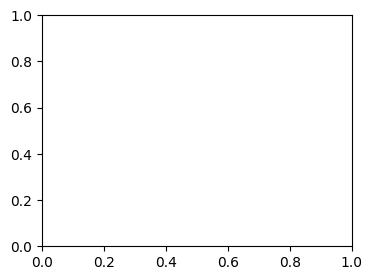

In [3]:
from sklearn.metrics import confusion_matrix
fig, ax = plt.subplots(figsize=(4,3))
ax = sns.heatmap(confusion_matrix(y_true,y_pred), annot=True,
                 annot_kws={'size':14, 'weight':'bold'},
                 fmt='d', cbar=False, cmap='Blues')
ax.set_xticklabels(['OK', 'Defective'])
ax.set_yticklabels(['OK', 'Defective'], va='center')
plt.tick_params(axis='both', labelsize=14, length=0)
plt.ylabel('Actual', size=14, weight='bold')
plt.xlabel('Predicted', size=14, weight='bold')
plt.show()

1/1 [==============================] - 0s 24ms/step


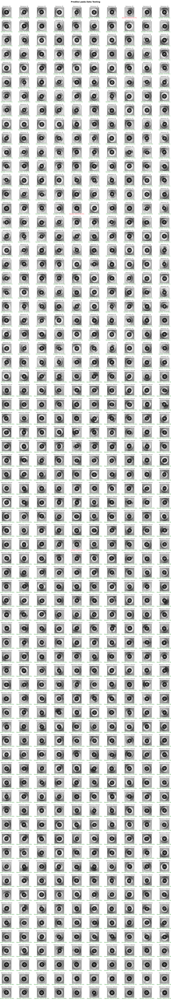

In [ ]:
class_map = {0: 'OK', 1: 'Defective'}
images, labels = next(iter(test_set))
images = images.reshape(batch_size,*img_size)

fig, ax = plt.subplots(715//10,10, figsize=(18,100))
fig.suptitle('Prediksi pada Data Testing', y=1.0, weight='bold', size=14)
for ax, img, label in zip(ax.flat, images, labels):
    ax.imshow(img, cmap='gray')
    [[pred_prob]] = best_model.predict(img.reshape(1, *img_size, -1))
    pred_label = class_map[int(pred_prob>=0.5)]
    true_label = class_map[label]
    prob_class = 100*pred_prob if pred_label=='Defective' else 100*(1-pred_prob)
    ax.set_title(f'Sebenarnya: {true_label}', size=7)
    ax.set_xlabel(f'Diprediksi: {pred_label} ({prob_class:.2f}%)', size=7,
                  color='g' if pred_label==true_label else 'r')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 23ms/step


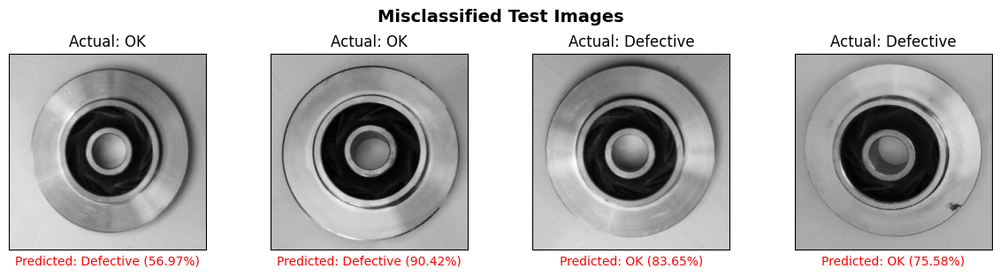

In [ ]:
misclassified = np.nonzero(y_pred != y_true)[0]
batch_num = misclassified // batch_size
image_num = misclassified % batch_size

fig, axes = plt.subplots(1, 4, figsize=(12, 3))
fig.suptitle('Misclassified Test Images', y=0.98, weight='bold', size=14)

for ax, bnum, inum in zip(axes.flat, batch_num, image_num):
    images, labels = test_set[bnum]
    img = images[inum]
    pred_prob = best_model.predict(img.reshape(1, *img_size, -1))[0][0]
    pred_label = class_map[int(pred_prob>=0.5)]
    true_label = class_map[labels[inum]]
    prob_class = 100*pred_prob if pred_label=='Defective' else 100*(1-pred_prob)
    ax.imshow(img.reshape(*img_size), cmap='gray')
    ax.set_title(f'Actual: {true_label}', size=12)
    ax.set_xlabel(f'Predicted: {pred_label} ({prob_class:.2f}%)', color='r')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()